In [21]:
#!pip install tensorflow[and-cuda] opencv-python seaborn pillow optuna scikit-learn numpy pandas matplotlib

In [31]:
#!pip install --upgrade pillow

In [ ]:
import os
import shutil
import pandas as pd
import numpy as np
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from sklearn.model_selection import train_test_split
import matplotlib.pyplot as plt
import seaborn as sns
from PIL import Image, ImageFile
import cv2
import random
from sklearn.utils.class_weight import compute_class_weight
import keras as k
from keras.models import Sequential
from keras.layers import Input,Conv2D,BatchNormalization,Activation,GlobalAveragePooling2D,Dropout,Dense,MaxPooling2D, Concatenate, Activation
from keras.callbacks import ReduceLROnPlateau, EarlyStopping
import tensorflow as tf
from tensorflow.keras.models import Sequential, Model
from tensorflow.keras.optimizers import Adam
from sklearn.metrics import classification_report, confusion_matrix, roc_curve, auc
from tensorflow.keras.utils import to_categorical
from tensorflow.keras import regularizers

2025-04-30 19:57:10.530650: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:477] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
E0000 00:00:1746043030.551432   13163 cuda_dnn.cc:8310] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
E0000 00:00:1746043030.557731   13163 cuda_blas.cc:1418] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered
2025-04-30 19:57:10.581878: I tensorflow/core/platform/cpu_feature_guard.cc:210] This TensorFlow binary is optimized to use available CPU instructions in performance-critical operations.
To enable the following instructions: AVX2 AVX512F FMA, in other operations, rebuild TensorFlow with the appropriate compiler flags.


In [2]:
current_directory = os.getcwd()
print(current_directory)
dir_base = os.path.join(current_directory,'Dataset')
print(dir_base)
fire_base = os.path.join(dir_base,'fire_images')
print(fire_base)
non_fire_base = os.path.join(dir_base,'non_fire_images')
print(non_fire_base)
# Define new output base directory
output_base_ = os.path.join(current_directory, 'Output')
print("Output Directory:", output_base_)

/home/dominikaik/computer_vision
/home/dominikaik/computer_vision/Dataset
/home/dominikaik/computer_vision/Dataset/fire_images
/home/dominikaik/computer_vision/Dataset/non_fire_images
Output Directory: /home/dominikaik/computer_vision/Output


In [3]:
print(os.path.join(output_base_, "train"))

/home/dominikaik/computer_vision/Output/train


In [4]:
# List all images, ensuring only files are included (excluding directories like .ipynb_checkpoints)
fire_images = [os.path.join(fire_base, img) for img in os.listdir(fire_base) 
               if os.path.isfile(os.path.join(fire_base, img)) and not img.startswith('.')]
nonfire_images = [os.path.join(non_fire_base, img) for img in os.listdir(non_fire_base) 
                  if os.path.isfile(os.path.join(non_fire_base, img)) and not img.startswith('.')]

# Assign labels
fire_labels = [1] * len(fire_images)
nonfire_labels = [0] * len(nonfire_images)

# Combine datasets
all_images = fire_images + nonfire_images
all_labels = fire_labels + nonfire_labels

# Split dataset into train, validation, and test sets
X_train, X_temp, y_train, y_temp = train_test_split(all_images, all_labels, test_size=0.3, stratify=all_labels, random_state=20)
X_val, X_test, y_val, y_test = train_test_split(X_temp, y_temp, test_size=0.5, stratify=y_temp, random_state=20)

# Define output directories for dataset splits
output_dirs = {
    "train": os.path.join(output_base_, "train"),
    "val": os.path.join(output_base_, "val"),
    "test": os.path.join(output_base_, "test")
}

# Create directories for each split (fire and nonfire folders inside)
for split in output_dirs:
    os.makedirs(os.path.join(output_dirs[split], "fire"), exist_ok=True)
    os.makedirs(os.path.join(output_dirs[split], "nonfire"), exist_ok=True)

# Function to copy images to their respective directories
def copy_images(image_paths, labels, split):
    for img_path, label in zip(image_paths, labels):
        if not os.path.isfile(img_path):  # Ensure it's a file, not a directory
            print(f"Skipping non-file: {img_path}")
            continue
        category = "fire" if label == 1 else "nonfire"
        dest_path = os.path.join(output_dirs[split], category, os.path.basename(img_path))
        shutil.copy(img_path, dest_path)

# Copy images into their respective folders
copy_images(X_train, y_train, "train")
copy_images(X_val, y_val, "val")
copy_images(X_test, y_test, "test")

print("Dataset successfully split and saved.")


Dataset successfully split and saved.


In [5]:
img_size=(320,320)
bth_size=32

In [6]:
def random_crop(img, crop_size=(int(img_size[0]*0.9), int(img_size[1]*0.9))):
    x = np.random.randint(0, img.shape[0] - crop_size[0] + 1)
    y = np.random.randint(0, img.shape[1] - crop_size[1] + 1)
    cropped = img[x:x+crop_size[0], y:y+crop_size[1], :]
    return cv2.resize(cropped, (img_size[1], img_size[0]))

In [7]:
# Augmenting Images for training set
trdatagen = ImageDataGenerator(
    rescale=1.0/255,
    rotation_range=15,
    width_shift_range=0.15,
    height_shift_range=0.15,
    shear_range=0.15,
    zoom_range=0.15,
    brightness_range=[0.8, 1.0],        # color jitter
    channel_shift_range=0.1,
    horizontal_flip=True,
    vertical_flip=True,
    preprocessing_function=random_crop,
    validation_split=0.1
)

# Only Rescaling or Normalizing the pixel values for testing Set
tedatagen = ImageDataGenerator(rescale=1.0/255)

In [8]:
# Reading the training data from directory

traingen= trdatagen.flow_from_directory(
    os.path.join(output_base_, "train"),
    target_size=img_size,
    batch_size=bth_size,
    color_mode='rgb',  
    class_mode='categorical',
    shuffle=True)

# Reading the testing data from Directory

testgen = tedatagen.flow_from_directory(
    os.path.join(output_base_, "test"),
    target_size=img_size,
    batch_size=bth_size,
    color_mode='rgb', 
    class_mode='categorical',
    shuffle=False
)

# Validation data 
valgen = trdatagen.flow_from_directory(
    os.path.join(output_base_, "val"),
    target_size=img_size,
    batch_size=bth_size,
    color_mode='rgb',  
    class_mode='categorical',
    shuffle=True,
      
)

Found 695 images belonging to 2 classes.
Found 150 images belonging to 2 classes.
Found 149 images belonging to 2 classes.


In [9]:
classes = traingen.classes
class_weights = compute_class_weight(
    class_weight='balanced',
    classes=np.unique(classes),
    y=classes
)
class_weight_dict = dict(enumerate(class_weights))

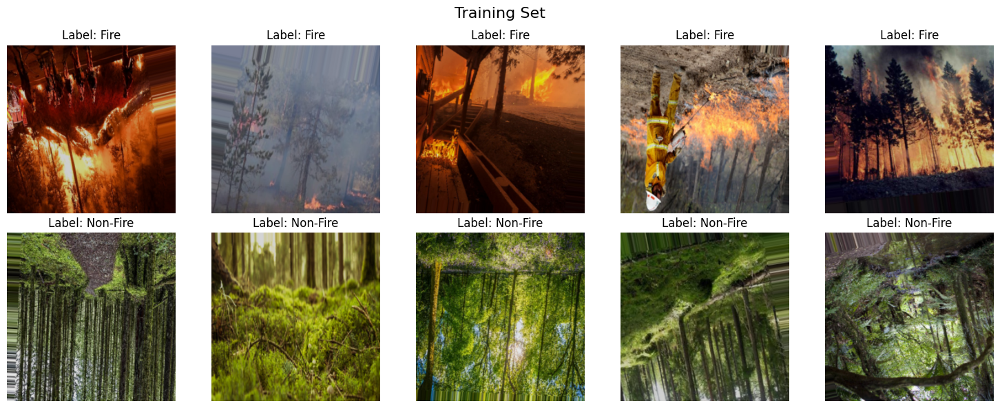

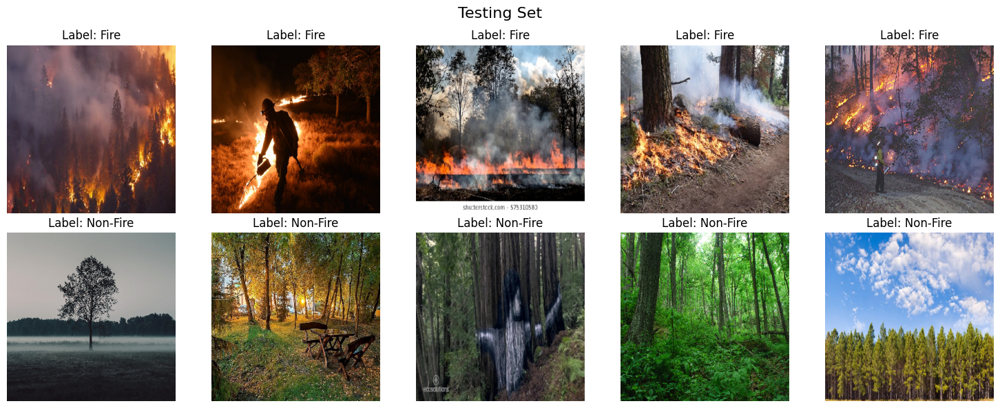

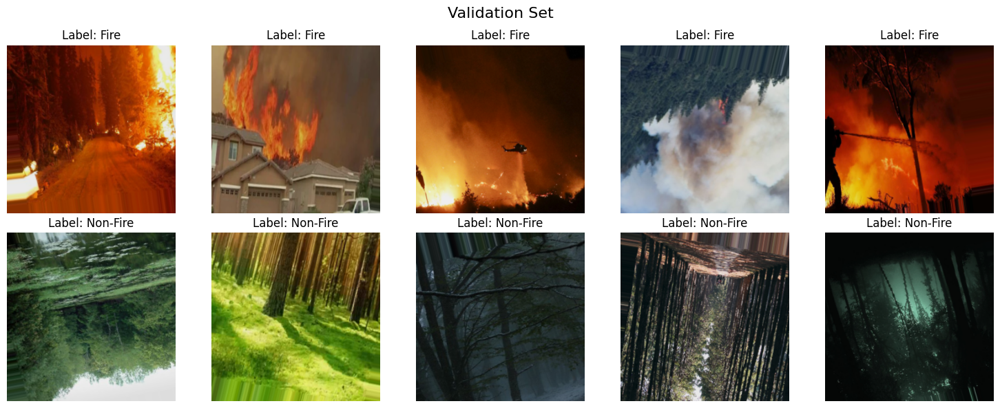

In [10]:
def plot_balanced_images(generator, title, num_per_class=5):
    images_collected = {"fire": [], "nonfire": []}  
    
    while len(images_collected["fire"]) < num_per_class or len(images_collected["nonfire"]) < num_per_class:
        images, labels = next(generator)  
        class_indices = generator.class_indices  
        inv_class_indices = {v: k for k, v in class_indices.items()} 
        class_labels = np.argmax(labels, axis=1)  
        for img, label_idx in zip(images, class_labels):
            class_name = inv_class_indices[label_idx]  
            if class_name in images_collected and len(images_collected[class_name]) < num_per_class:
                images_collected[class_name].append(img)
        if generator.batch_index == 0:
            break  


    selected_images = images_collected["fire"][:num_per_class] + images_collected["nonfire"][:num_per_class]
    labels = ["Fire"] * num_per_class + ["Non-Fire"] * num_per_class
    num_rows = 2 if num_per_class > 1 else 1
    fig, axes = plt.subplots(num_rows, num_per_class, figsize=(15, 6))
    fig.suptitle(title, fontsize=16)
    if num_rows == 1:  
        axes = np.expand_dims(axes, axis=0)

    for i, (img, label) in enumerate(zip(selected_images, labels)):
        ax = axes[i // num_per_class, i % num_per_class]
        ax.imshow(img)
        ax.axis('off')
        ax.set_title(f"Label: {label}")

    plt.tight_layout()
    plt.show()

plot_balanced_images(traingen, "Training Set")
plot_balanced_images(testgen, "Testing Set")
plot_balanced_images(valgen, "Validation Set")

In [11]:
#fire
train_fire_dir_ = os.path.join(output_base_, "train")
train_fire_dir = os.path.join(train_fire_dir_, "fire")
print(train_fire_dir)
val_fire_dir_ = os.path.join(output_base_, "val")
val_fire_dir = os.path.join(val_fire_dir_, "fire")
print(val_fire_dir)
test_fire_dir_ = os.path.join(output_base_, "test")
test_fire_dir = os.path.join(test_fire_dir_, "fire")
print(test_fire_dir)

#non_fire
train_nonfire_dir_ = os.path.join(output_base_, "train")
train_nonfire_dir = os.path.join(train_nonfire_dir_, "nonfire")
print(train_nonfire_dir)
val_nonfire_dir_ = os.path.join(output_base_, "val")
val_nonfire_dir = os.path.join(val_nonfire_dir_, "nonfire")
print(val_nonfire_dir)
test_nonfire_dir_ = os.path.join(output_base_, "test")
test_nonfire_dir = os.path.join(test_nonfire_dir_, "nonfire")
print(test_nonfire_dir)

/home/dominikaik/computer_vision/Output/train/fire
/home/dominikaik/computer_vision/Output/val/fire
/home/dominikaik/computer_vision/Output/test/fire
/home/dominikaik/computer_vision/Output/train/nonfire
/home/dominikaik/computer_vision/Output/val/nonfire
/home/dominikaik/computer_vision/Output/test/nonfire


In [12]:
train_fire = len(os.listdir(train_fire_dir))
val_fire = len(os.listdir(val_fire_dir))
test_fire = len(os.listdir(test_fire_dir))
train_nonfire = len(os.listdir(train_nonfire_dir))
val_nonfire = len(os.listdir(val_nonfire_dir))
test_nonfire = len(os.listdir(test_nonfire_dir))

categories = ["Train", "Validation", "Test"]
fire_counts = [train_fire, val_fire, test_fire]
nonfire_counts = [train_nonfire, val_nonfire, test_nonfire]

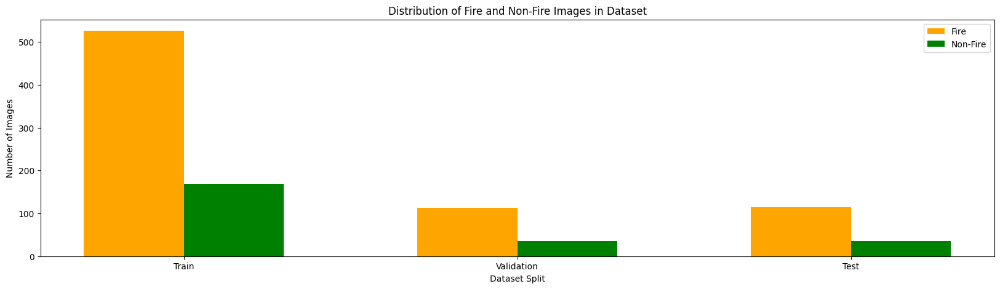

In [13]:
x = np.arange(len(categories))  
width = 0.3 

fig, ax = plt.subplots(figsize=(20, 5))
ax.bar(x - width/2, fire_counts, width, label="Fire", color="orange")  # Fire images
ax.bar(x + width/2, nonfire_counts, width, label="Non-Fire", color="green")  # Non-fire images

ax.set_xlabel("Dataset Split")
ax.set_ylabel("Number of Images")
ax.set_title("Distribution of Fire and Non-Fire Images in Dataset")
ax.set_xticks(x)
ax.set_xticklabels(categories)
ax.legend()

plt.show()

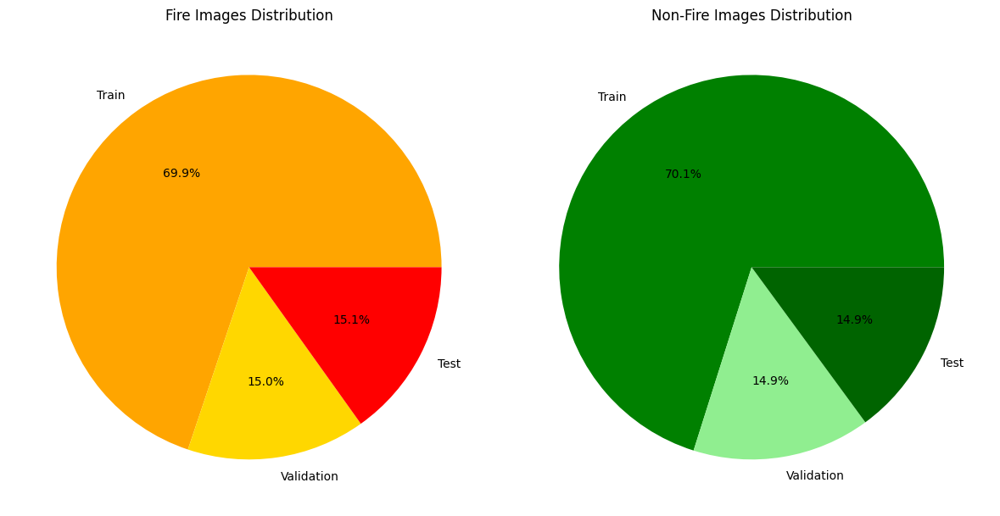

In [14]:
# Labels for dataset splits
labels = ['Train', 'Validation', 'Test']

# Data for fire and non-fire images
fire_counts = [train_fire, val_fire, test_fire]
non_fire_counts = [train_nonfire, val_nonfire, test_nonfire]

# Create figure for two pie charts
fig, axes = plt.subplots(1, 2, figsize=(12, 6))

# Fire Images Pie Chart
axes[0].pie(fire_counts, labels=labels, autopct='%1.1f%%', colors=['orange', 'gold', 'red'])
axes[0].set_title('Fire Images Distribution')

# Non-Fire Images Pie Chart
axes[1].pie(non_fire_counts, labels=labels, autopct='%1.1f%%', colors=['green', 'lightgreen', 'darkgreen'])
axes[1].set_title('Non-Fire Images Distribution')

plt.tight_layout()
plt.show()

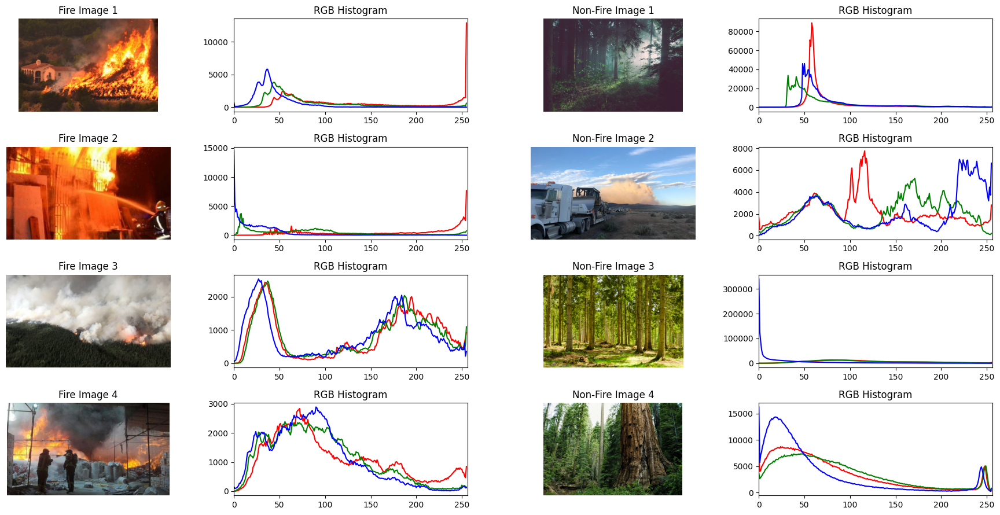

In [15]:
#HISTOGRAM analysis:
fire_dir = train_fire_dir  # Fire images
nonfire_dir = train_nonfire_dir  # Non-fire images

# Function to load three random images from a directory
def load_random_images(image_dir, num_images=4):
    image_files = [f for f in os.listdir(image_dir) if f.endswith(('.jpg', '.png', '.jpeg'))]
    if len(image_files) < num_images:
        return None  # Return None if not enough images found
    selected_images = random.sample(image_files, num_images)
    images = [cv2.cvtColor(cv2.imread(os.path.join(image_dir, img)), cv2.COLOR_BGR2RGB) for img in selected_images]
    return images

# Load three random fire and non-fire images
fire_images = load_random_images(fire_dir, num_images=4)
nonfire_images = load_random_images(nonfire_dir, num_images=4)

# Check if images were loaded
if fire_images is not None and nonfire_images is not None:
    # Create subplots for fire and non-fire images with histograms
    fig, axes = plt.subplots(4, 4, figsize=(18, 9))

    # Function to plot image and its histogram
    def plot_histogram(image, ax_img, ax_hist, title):
        ax_img.imshow(image)
        ax_img.set_title(title)
        ax_img.axis('off')

        colors = ('r', 'g', 'b')
        for i, color in enumerate(colors):
            hist = cv2.calcHist([image], [i], None, [256], [0, 256])
            ax_hist.plot(hist, color=color)
            ax_hist.set_xlim([0, 256])
        ax_hist.set_title("RGB Histogram")

    # Plot Fire Images and Histograms
    for i in range(4):
        plot_histogram(fire_images[i], axes[i, 0], axes[i, 1], f"Fire Image {i+1}")

    # Plot Non-Fire Images and Histograms
    for i in range(4):
        plot_histogram(nonfire_images[i], axes[i, 2], axes[i, 3], f"Non-Fire Image {i+1}")

    # Adjust layout
    plt.tight_layout()
    plt.show()
else:
    print("Could not load enough images from the specified directories.")

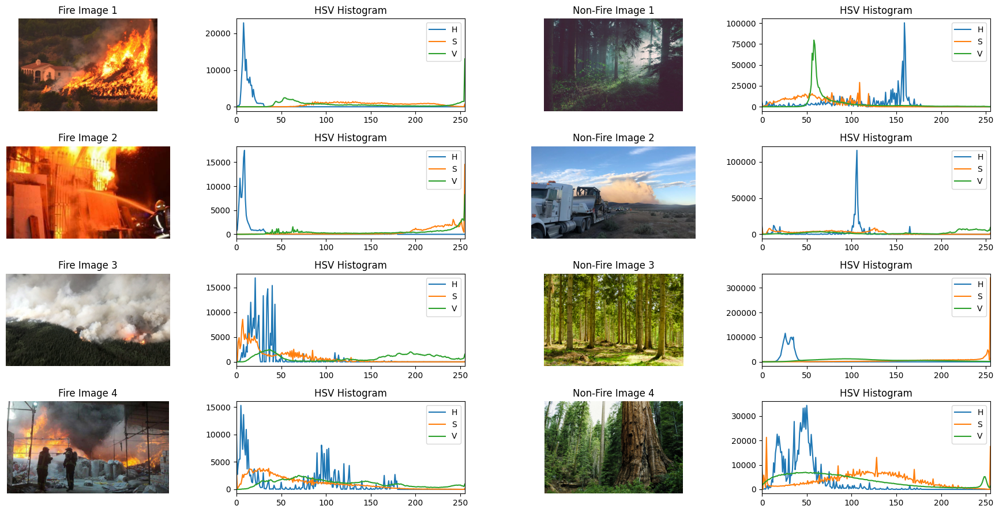

In [16]:
if fire_images and nonfire_images:
    fig, axes = plt.subplots(4, 4, figsize=(18, 9))

    def plot_hsv_histogram(img, ax_img, ax_hist, title):
        # Show the image
        ax_img.imshow(img)
        ax_img.set_title(title)
        ax_img.axis('off')

        # Convert to HSV
        hsv = cv2.cvtColor(img, cv2.COLOR_RGB2HSV)
        channels = ('H', 'S', 'V')
        for i, ch in enumerate(channels):
            hist = cv2.calcHist([hsv], [i], None, [256], [0, 256])
            ax_hist.plot(hist, label=ch)
            ax_hist.set_xlim(0, 255)
        ax_hist.set_title("HSV Histogram")
        ax_hist.legend(loc='upper right')

    # Plot fire images + HSV histograms
    for i in range(4):
        plot_hsv_histogram(fire_images[i], axes[i, 0], axes[i, 1], f"Fire Image {i+1}")

    # Plot non-fire images + HSV histograms
    for i in range(4):
        plot_hsv_histogram(nonfire_images[i], axes[i, 2], axes[i, 3], f"Non-Fire Image {i+1}")

    plt.tight_layout()
    plt.show()
else:
    print("Could not load enough images from the specified directories.")

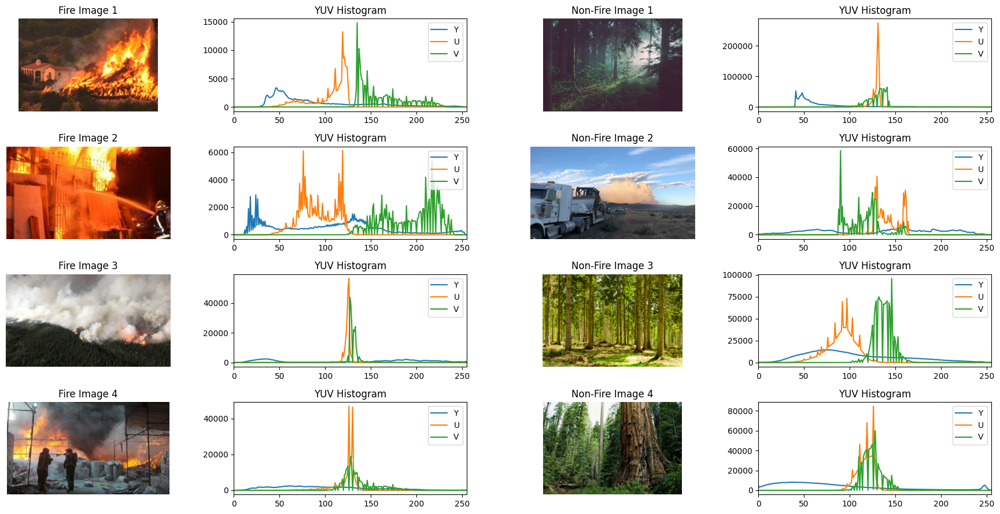

In [17]:
if fire_images and nonfire_images:
    fig, axes = plt.subplots(4, 4, figsize=(18, 9))

    def plot_yuv_histogram(img, ax_img, ax_hist, title):
        # Show the image
        ax_img.imshow(img)
        ax_img.set_title(title)
        ax_img.axis('off')

        # Convert to YUV
        yuv = cv2.cvtColor(img, cv2.COLOR_RGB2YUV)
        channels = ('Y', 'U', 'V')
        for i, ch in enumerate(channels):
            hist = cv2.calcHist([yuv], [i], None, [256], [0, 256])
            ax_hist.plot(hist, label=ch)
            ax_hist.set_xlim(0, 255)
        ax_hist.set_title("YUV Histogram")
        ax_hist.legend(loc='upper right')

    # Plot fire images + YUV histograms
    for i in range(4):
        plot_yuv_histogram(fire_images[i], axes[i, 0], axes[i, 1], f"Fire Image {i+1}")

    # Plot non-fire images + YUV histograms
    for i in range(4):
        plot_yuv_histogram(nonfire_images[i], axes[i, 2], axes[i, 3], f"Non-Fire Image {i+1}")

    plt.tight_layout()
    plt.show()
else:
    print("Could not load enough images from the specified directories.")

In [18]:
def _safe_normalize(hist, bins):
    hist = hist.astype(np.float32)
    s = hist.sum()
    if s > 0:
        hist /= s
    else:
        hist[:] = 1.0 / bins
    return hist

In [19]:
def compute_histogram(image, bins=256):
    """
    Compute normalized RGB histograms for the given image.
    Returns a concatenated vector of length 768 (256 bins per channel).
    """
    # Calculate histogram for each channel (assumes image is in RGB)
    hist_r = cv2.calcHist([image], [0], None, [bins], [0,256])
    hist_g = cv2.calcHist([image], [1], None, [bins], [0,256])
    hist_b = cv2.calcHist([image], [2], None, [bins], [0,256])
    hist_r = _safe_normalize(hist_r, bins)
    hist_g = _safe_normalize(hist_g, bins)
    hist_b = _safe_normalize(hist_b, bins)

    hsv = cv2.cvtColor(image, cv2.COLOR_RGB2HSV)
    
    # Hue range in OpenCV is [0,179]
    hsv = cv2.cvtColor(image, cv2.COLOR_RGB2HSV)
    hist_h = cv2.calcHist([hsv], [0], None, [bins], [0,180])
    hist_s = cv2.calcHist([hsv], [1], None, [bins], [0,256])
    hist_v = cv2.calcHist([hsv], [2], None, [bins], [0,256])
    hist_h = _safe_normalize(hist_h, bins)
    hist_s = _safe_normalize(hist_s, bins)
    hist_v = _safe_normalize(hist_v, bins)

    yuv = cv2.cvtColor(image, cv2.COLOR_RGB2YUV)
    hist_y  = cv2.calcHist([yuv], [0], None, [bins], [0,256])
    hist_u  = cv2.calcHist([yuv], [1], None, [bins], [0,256])
    hist_v2 = cv2.calcHist([yuv], [2], None, [bins], [0,256])
    hist_y  = _safe_normalize(hist_y, bins)
    hist_u  = _safe_normalize(hist_u, bins)
    hist_v2 = _safe_normalize(hist_v2, bins)
    
    # Concatenate the histograms into a single feature vector
    hist_features = np.concatenate([
        hist_r.ravel(), hist_g.ravel(), hist_b.ravel(),
        hist_h.ravel(), hist_s.ravel(), hist_v.ravel(),
        hist_y.ravel(), hist_u.ravel(), hist_v2.ravel(),
    ]).astype(np.float32)
    
    return hist_features.astype(np.float32)

def dataset_from_image_gen(image_gen, bins=256):
    """
    Wrap an existing image generator so that it yields:
      ([images, histogram_features], labels)
    which matches a dual-input model.
    """
    def gen():
        while True:
            images, labels = next(image_gen)  
            
            # compute the full 2304-D histograms for the batch
            all_hist = np.array([compute_histogram(img, bins=bins) for img in images], dtype=np.float32)  
            
            # split into 3 chunks of length 768 each
            rgb_hist = all_hist[:,   0:768]
            hsv_hist = all_hist[:, 768:1536]
            yuv_hist = all_hist[:,1536:2304]
            
            yield (images, rgb_hist, hsv_hist, yuv_hist), labels


    image_spec = tf.TensorSpec((None,320,320,3), tf.float32)
    rgb_spec   = tf.TensorSpec((None,768),      tf.float32)
    hsv_spec   = tf.TensorSpec((None,768),      tf.float32)
    yuv_spec   = tf.TensorSpec((None,768),      tf.float32)
    label_spec = tf.TensorSpec((None, 2),       tf.float32)
    
    output_signature = ((image_spec, rgb_spec, hsv_spec, yuv_spec),
                        tf.TensorSpec((None,2), tf.float32))


    return tf.data.Dataset.from_generator(gen, output_signature=output_signature)

In [20]:
# Define model
model = Sequential()

# CNN Layer 1
image_input = Input(shape=(320, 320, 3), name='image_input')
x = Conv2D(32, (3, 3), padding='same', activation='relu')(image_input)
x = BatchNormalization()(x)
x = MaxPooling2D(pool_size=(2, 2))(x)
x = Dropout(0.25)(x)

# CNN Layer 2
x = Conv2D(64, (3, 3), padding='same', activation='relu')(x)
x = BatchNormalization()(x)
x = MaxPooling2D(pool_size=(2, 2))(x)
x = Dropout(0.25)(x)

# CNN Layer 3
x = Conv2D(128, (3, 3), padding='same', activation='relu')(x)
x = BatchNormalization()(x)
x = MaxPooling2D(pool_size=(2, 2))(x)
x = Dropout(0.25)(x)

# Global Average Pooling instead of Flatten
x = GlobalAveragePooling2D()(x)

# RGB Histogram 
rgb_hist_input = Input(shape=(768,), name='hist_input')
h_rgb = Dense(128, activation='relu')(rgb_hist_input)
h_rgb = Dropout(0.3)(h_rgb)
h_rgb = Dense(64, activation='relu')(h_rgb)

# HSV Histogram
hsv_input = Input(shape=(768,), name='hsv_input')
h_hsv = Dense(128, activation='relu')(hsv_input)
h_hvs = Dropout(0.3)(h_hsv)
h_hsv = Dense(64, activation='relu')(h_hsv)

# YUV Histogram
yuv_input = Input(shape=(768,), name='yuv_hist_input')
h_yuv  = Dense(128, activation='relu')(yuv_input)
h_yuv  = Dropout(0.3)(h_yuv)
h_yuv  = Dense(64,  activation='relu')(h_yuv)
                        
# Dense Layer
merged = Concatenate()([ x, h_rgb, h_hsv, h_yuv ]) 
merged = Dense(64, activation='relu', kernel_regularizer=regularizers.l2(1e-4))(merged)
merged = Dropout(0.3)(merged)

# Output Layer
output = Dense(2, activation='softmax')(merged)

# Compile Model
model = Model(inputs=[image_input, rgb_hist_input, hsv_input, yuv_input], outputs=output)
model.compile(optimizer=Adam(learning_rate=0.001), loss='binary_crossentropy', metrics=['accuracy'])

# Summary
model.summary()

W0000 00:00:1746043045.619094   13163 gpu_device.cc:2344] Cannot dlopen some GPU libraries. Please make sure the missing libraries mentioned above are installed properly if you would like to use GPU. Follow the guide at https://www.tensorflow.org/install/gpu for how to download and setup the required libraries for your platform.
Skipping registering GPU devices...


Model: "functional"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ image_input         │ (None, 320, 320,  │          0 │ -                 │
│ (InputLayer)        │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d (Conv2D)     │ (None, 320, 320,  │        896 │ image_input[0][0] │
│                     │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalization │ (None, 320, 320,  │        128 │ conv2d[0][0]      │
│ (BatchNormalizatio… │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ max_pooling2d       │ (None, 160, 160,  │          0 │ batch_normalizat… │
│ (MaxPooling2D)      │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dropout (Dropout)   │ (None, 160, 160,  │          0 │ max_pooling2d[0]… │
│                     │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_1 (Conv2D)   │ (None, 160, 160,  │     18,496 │ dropout[0][0]     │
│                     │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 160, 160,  │        256 │ conv2d_1[0][0]    │
│ (BatchNormalizatio… │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ max_pooling2d_1     │ (None, 80, 80,    │          0 │ batch_normalizat… │
│ (MaxPooling2D)      │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dropout_1 (Dropout) │ (None, 80, 80,    │          0 │ max_pooling2d_1[… │
│                     │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_2 (Conv2D)   │ (None, 80, 80,    │     73,856 │ dropout_1[0][0]   │
│                     │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 80, 80,    │        512 │ conv2d_2[0][0]    │
│ (BatchNormalizatio… │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ hist_input          │ (None, 768)       │          0 │ -                 │
│ (InputLayer)        │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ yuv_hist_input      │ (None, 768)       │          0 │ -                 │
│ (InputLayer)        │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ max_pooling2d_2     │ (None, 40, 40,    │          0 │ batch_normalizat… │
│ (MaxPooling2D)      │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dense (Dense)       │ (None, 128)       │     98,432 │ hist_input[0][0]  │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ hsv_input           │ (None, 768)       │          0 │ -                 │
│ (InputLayer)        │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dense_4 (Dense)     │ (None, 128)       │     98,432 │ yuv_hist_input[0… │
├─────────────────────┼───────────────────┼────────────┼─────────────────

 Total params: 434,882 (1.66 MB)

 Trainable params: 434,434 (1.66 MB)

 Non-trainable params: 448 (1.75 KB)

In [21]:
#Implementing Early Stopping and Learning Rate Reduction
es=EarlyStopping(monitor='val_loss', patience=10, verbose=1, restore_best_weights=True)
lr=ReduceLROnPlateau(monitor='val_loss', factor=0.001, patience=10, verbose=1, min_delta=0.0001)

callbacks_list=[es,lr]

In [22]:
train_dataset = dataset_from_image_gen(traingen, bins=256)
val_dataset   = dataset_from_image_gen(valgen, bins=256)

history = model.fit(
    train_dataset,
    epochs=50,
    steps_per_epoch=len(traingen),
    validation_data=val_dataset,
    validation_steps=len(valgen),
    callbacks=callbacks_list,
    class_weight=class_weight_dict
)

Epoch 1/50


/home/dominikaik/.local/lib/python3.10/site-packages/keras/src/models/functional.py:225: UserWarning: The structure of `inputs` doesn't match the expected structure: ['image_input', 'hist_input', 'hsv_input', 'yuv_hist_input']. Received: the structure of inputs=('*', '*', '*', '*')
  warnings.warn(


22/22 ━━━━━━━━━━━━━━━━━━━━ 121s 5s/step - accuracy: 0.7461 - loss: 0.4470 - val_accuracy: 0.7383 - val_loss: 0.5984 - learning_rate: 0.0010
Epoch 2/50
22/22 ━━━━━━━━━━━━━━━━━━━━ 113s 5s/step - accuracy: 0.8927 - loss: 0.2242 - val_accuracy: 0.7919 - val_loss: 0.4951 - learning_rate: 0.0010
Epoch 3/50
22/22 ━━━━━━━━━━━━━━━━━━━━ 110s 5s/step - accuracy: 0.9394 - loss: 0.1859 - val_accuracy: 0.7181 - val_loss: 0.5234 - learning_rate: 0.0010
Epoch 4/50
22/22 ━━━━━━━━━━━━━━━━━━━━ 109s 5s/step - accuracy: 0.8996 - loss: 0.1748 - val_accuracy: 0.7584 - val_loss: 0.5720 - learning_rate: 0.0010
Epoch 5/50
22/22 ━━━━━━━━━━━━━━━━━━━━ 109s 5s/step - accuracy: 0.9181 - loss: 0.1882 - val_accuracy: 0.7919 - val_loss: 0.5908 - learning_rate: 0.0010
Epoch 6/50
22/22 ━━━━━━━━━━━━━━━━━━━━ 109s 5s/step - accuracy: 0.9472 - loss: 0.1459 - val_accuracy: 0.7315 - val_loss: 0.4877 - learning_rate: 0.0010
Epoch 7/50
22/22 ━━━━━━━━━━━━━━━━━━━━ 109s 5s/step - accuracy: 0.8784 - loss: 0.2312 - val_accuracy: 0.76

In [23]:
test_dataset = dataset_from_image_gen(testgen, bins=256)

test_loss, test_accuracy = model.evaluate(
    test_dataset,
    steps=len(testgen)
)

5/5 ━━━━━━━━━━━━━━━━━━━━ 6s 1s/step - accuracy: 0.9142 - loss: 0.1801


Test Accuracy: 0.94
5/5 ━━━━━━━━━━━━━━━━━━━━ 6s 1s/step
Classification Report:
              precision    recall  f1-score   support

           0       0.94      0.98      0.96       114
           1       0.94      0.81      0.87        36

    accuracy                           0.94       150
   macro avg       0.94      0.89      0.91       150
weighted avg       0.94      0.94      0.94       150

Confusion Matrix:
[[112   2]
 [  7  29]] 




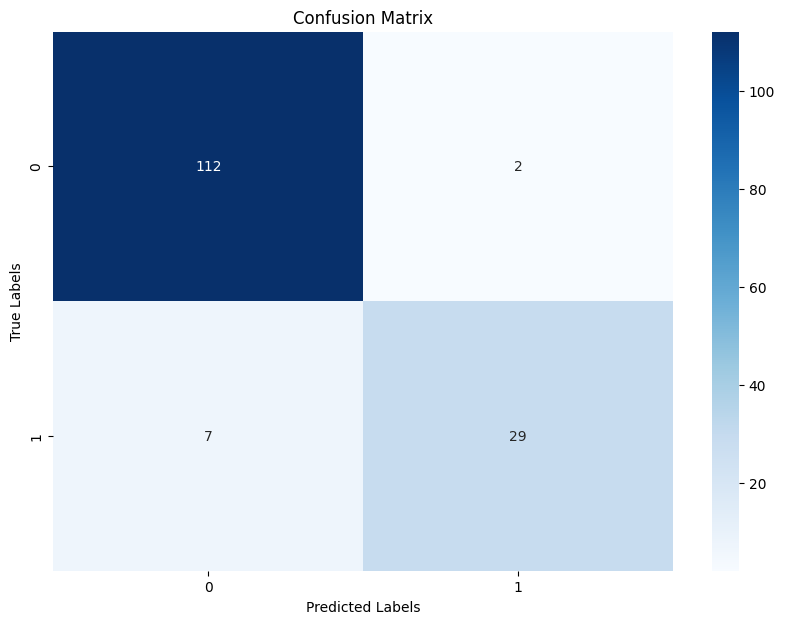

Training class indices: {'fire': 0, 'nonfire': 1}
Test class indices: {'fire': 0, 'nonfire': 1}


In [24]:
print(f"Test Accuracy: {test_accuracy:.2f}")

y_pred = np.argmax(model.predict(test_dataset, steps=len(testgen)), axis=1)
y_true = testgen.classes

print("Classification Report:")
print(classification_report(y_true, y_pred))
conf_matrix = confusion_matrix(y_true, y_pred)

print("Confusion Matrix:")
print(conf_matrix,'\n\n')
plt.figure(figsize=(10, 7))
sns.heatmap(conf_matrix, annot=True, fmt='d', cmap='Blues', )

plt.title('Confusion Matrix')
plt.xlabel('Predicted Labels')
plt.ylabel('True Labels')
plt.show()

print("Training class indices:", traingen.class_indices)
print("Test class indices:", testgen.class_indices)

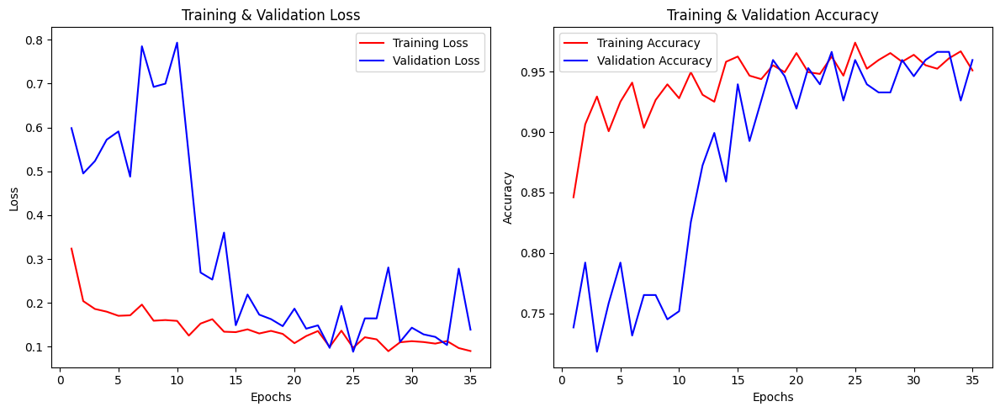

In [25]:
train_loss = history.history['loss']
val_loss = history.history['val_loss']
train_acc = history.history['accuracy']
val_acc = history.history['val_accuracy']
epochs = range(1, len(train_loss) + 1)


plt.figure(figsize=(12, 5))
plt.subplot(1, 2, 1)
plt.plot(epochs, train_loss, 'r', label='Training Loss')
plt.plot(epochs, val_loss, 'b', label='Validation Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.title('Training & Validation Loss')
plt.legend()
plt.subplot(1, 2, 2)
plt.plot(epochs, train_acc, 'r', label='Training Accuracy')
plt.plot(epochs, val_acc, 'b', label='Validation Accuracy')
plt.xlabel('Epochs')
plt.ylabel('Accuracy')
plt.title('Training & Validation Accuracy')
plt.legend()

plt.tight_layout()
plt.show()

Part 2) Fire and edge detection

In [26]:
current_directory = os.getcwd()
print(current_directory)
dir_save = os.path.join(current_directory,'fired_images_classified')
print(dir_save)
test_dir = os.path.join(output_base_, "test")
print(test_dir)

/home/dominikaik/computer_vision
/home/dominikaik/computer_vision/fired_images_classified
/home/dominikaik/computer_vision/Output/test


In [ ]:
im_path_ = os.path.join(output_base_, "test")
im_path = os.path.join(im_path_, "fire")
print("Fire Image Directory:", im_path)

image_files = [f for f in os.listdir(im_path)]
print("Number of images:", len(image_files))

# Ask user for index input
while True:
    try:
        user_index = int(input(f"Enter an image number between 1 and {len(image_files)}: "))
        if 1 <= user_index <= len(image_files):
            break
        else:
            print(f"Please enter a number between 1 and {len(image_files)}.")
    except ValueError:
        print("Invalid input. Please enter a valid number.")

image_path = os.path.join(im_path, image_files[user_index])
img = Image.open(image_path).convert('RGB')
plt.imshow(img)
plt.axis('off')
plt.title(f"Fire Image #{user_index}")
plt.show()


Fire Image Directory: /home/dominikaik/computer_vision/Output/test/fire
Number of images: 114


In [10]:
def rgb2hsv(RGB):
    '''
    Performs RGB to HSV conversion on the input Image object RGB and
    returns HSV representation as a numpy array.
    Uses "A. R. Smith, “Color gamut transform pairs,” 
    ACM SIGGRAPH Computer Graphics, vol. 12, no. 3. Association for Computing Machinery (ACM), 
    pp. 12-19, Aug. 23, 1978. doi: 10.1145/965139.807361."
    '''
    RGB = np.array(RGB).astype(float) / 255.0
    HSV = np.zeros(RGB.shape)
    for y in range(RGB.shape[0]):
        for x in range(RGB.shape[1]):
            R, G, B = RGB[y,x,:]
            V = np.max((R, G, B))
            m = np.min((R, G, B))
            C = V - m
            if V == 0.0:
                S = 0.0
            else:
                S = C / V
                
            if C == 0.0:
                H = 0.0
            else:
                if V == R:
                    H_prime = (G-B) / C
                elif V == G:
                    H_prime = (B-R) / C + 2
                elif V == B:
                    H_prime = (R-G) / V + 4
                
                if H_prime < 0:
                    H = H_prime / 6 + 1
                else:
                    H = H_prime / 6
            
            HSV[y,x,0] = H
            HSV[y,x,1] = S
            HSV[y,x,2] = V
    
    return HSV

In [11]:
hsv = rgb2hsv(img)

In [12]:
hsv.shape

(495, 880, 3)

In [13]:
H = Image.fromarray((hsv[:,:,0] * 255).astype(np.uint8))
S = Image.fromarray((hsv[:,:,1] * 255).astype(np.uint8))
V = Image.fromarray((hsv[:,:,2] * 255).astype(np.uint8))

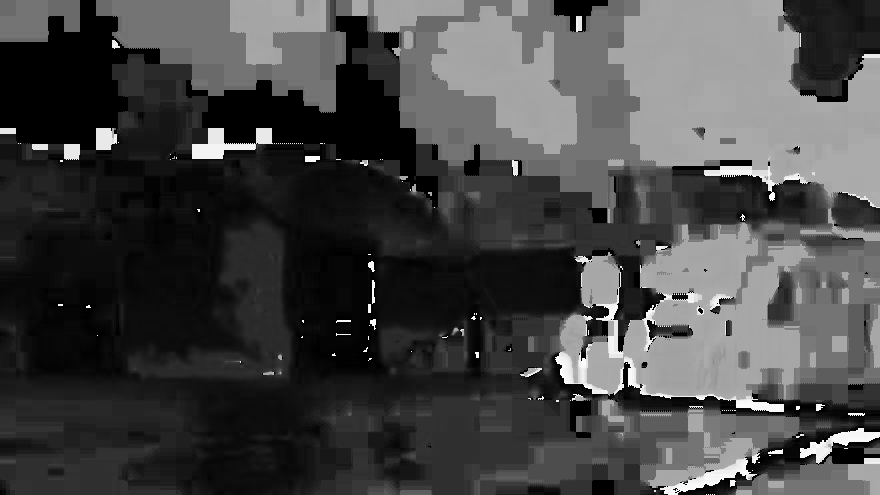

In [14]:
display(H)

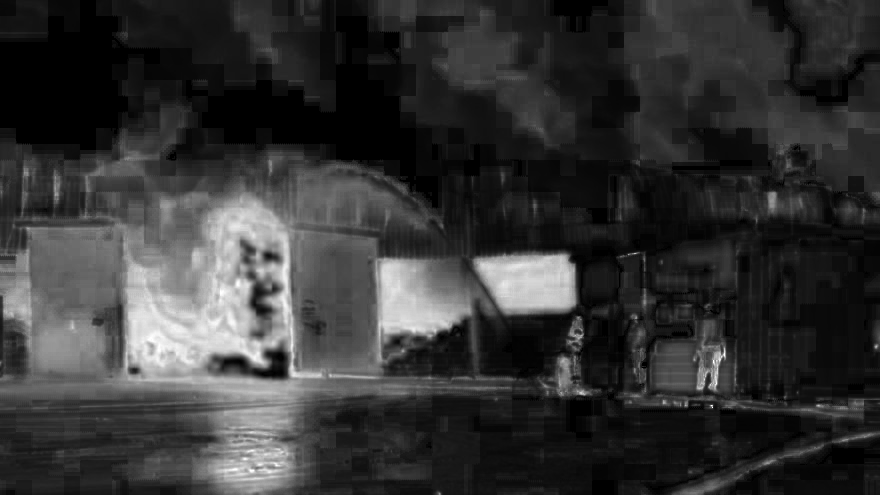

In [15]:
display(S)

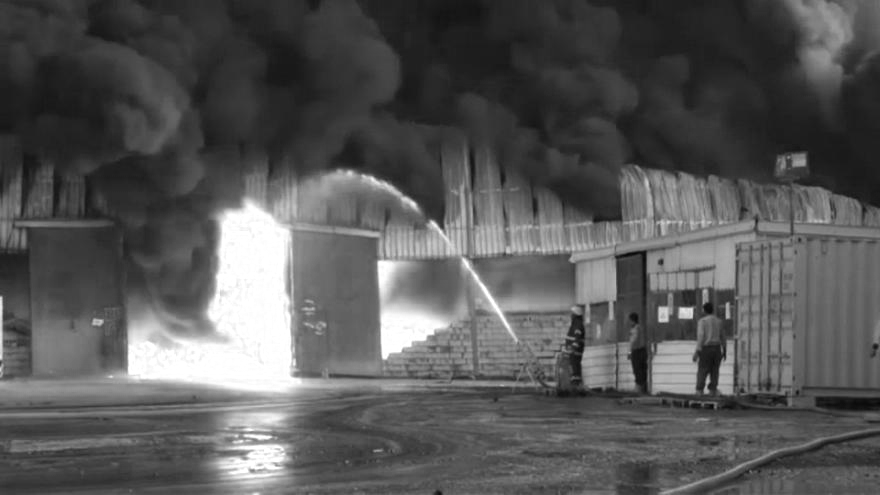

In [16]:
display(V)

2.1) Fire Detection using Optimized thresholding HSV

In [26]:
import optuna

def generate_fire_mask(img, h_min, h_max, s_min, v_min):
    hsv = rgb2hsv(img)
    h = hsv[:, :, 0]
    s = hsv[:, :, 1]
    v = hsv[:, :, 2]

    mask = ((h >= h_min) & (h <= h_max) & (s >= s_min) & (v >= v_min)).astype(np.uint8)
    return mask

def evaluate_mask(mask):
    # Simple proxy: maximize the number of fire pixels (as a ratio), could be replaced with IoU if ground truth available
    fire_ratio = np.sum(mask) / mask.size
    return fire_ratio

def objective(trial):
    h_min = trial.suggest_float("h_min", 0.0, 0.2)
    h_max = trial.suggest_float("h_max", h_min, 0.3)
    s_min = trial.suggest_float("s_min", 0.2, 1.0)
    v_min = trial.suggest_float("v_min", 0.2, 1.0)

    mask = generate_fire_mask(img, h_min, h_max, s_min, v_min)
    score = evaluate_mask(mask)
    return score

study = optuna.create_study(direction="maximize")
study.optimize(objective, n_trials=50)

print("Best HSV Thresholds:")
for key, value in study.best_params.items():
    print(f"{key}: {value:.3f}")


[I 2025-04-18 17:24:18,457] A new study created in memory with name: no-name-22fc4281-57f9-4b2b-ba00-e61e32aa3be3
[I 2025-04-18 17:24:23,532] Trial 0 finished with value: 0.11951101928374655 and parameters: {'h_min': 0.011896180811584767, 'h_max': 0.09305328924582693, 's_min': 0.3144789991640969, 'v_min': 0.3120263641802781}. Best is trial 0 with value: 0.11951101928374655.
[I 2025-04-18 17:24:28,564] Trial 1 finished with value: 0.03005050505050505 and parameters: {'h_min': 0.10126660300009152, 'h_max': 0.2165739686977616, 's_min': 0.2880981935076256, 'v_min': 0.2629041698669996}. Best is trial 0 with value: 0.11951101928374655.
[I 2025-04-18 17:24:33,519] Trial 2 finished with value: 0.0367722681359045 and parameters: {'h_min': 0.0494479295833032, 'h_max': 0.10691063015047575, 's_min': 0.3861411312688143, 'v_min': 0.5688104492578407}. Best is trial 0 with value: 0.11951101928374655.
[I 2025-04-18 17:24:38,473] Trial 3 finished with value: 0.0 and parameters: {'h_min': 0.1325554461587

Best HSV Thresholds:
h_min: 0.012
h_max: 0.093
s_min: 0.314
v_min: 0.312


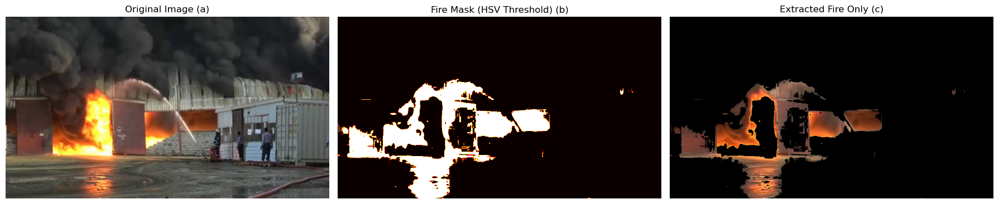

In [53]:
def detect_fire_pil(img):
    image_np = rgb2hsv(img)

    h = image_np[:, :, 0]
    s = image_np[:, :, 1]
    v = image_np[:, :, 2]

    #fire_mask = (
        #(h >= 0.0) & (h <= 0.15) &  # Hue range for fire
        #(s >= 0.4) & (v >= 0.4)     # Saturation and brightness
    #).astype(np.uint8)
    
    #fire_mask = (
        #(h >= 0.015) & (h <= 0.155) &  # Hue range for fire
        #(s >= 0.266) & (v >= 0.412)     # Saturation and brightness
    #).astype(np.uint8)

    fire_mask = (
        (h >=  0.012) & (h <= 0.093) &  # Hue range for fire
        (s >= 0.314) & (v >=0.312)     # Saturation and brightness
    ).astype(np.uint8)

    # Mask fire regions
    fire_mask_np = fire_mask.astype(np.uint8)

    fig, axes = plt.subplots(1, 3, figsize=(18, 6))
    axes[0].imshow(img)
    axes[0].set_title("Original Image (a)")
    axes[0].axis("off")

    axes[1].imshow(fire_mask_np, cmap="hot")
    axes[1].set_title("Fire Mask (HSV Threshold) (b)")
    axes[1].axis("off")
    mask_image = Image.fromarray(fire_mask_np * 255).convert("L")
    mask_image.save("fire_mask_output.png")

    # Convert original image to NumPy array
    img_np_ = np.array(img)
    
    # Expand fire mask to 3 channels to match image shape
    fire_mask_3c = np.stack([fire_mask_np]*3, axis=-1)
    
    # Apply the mask: keep fire regions, set others to black
    fire_only = img_np_ * fire_mask_3c
    
    fire_only_image = Image.fromarray(fire_only.astype(np.uint8))
    fire_only_image.save("fire_only_extracted.png")
    axes[2].imshow(fire_only_image)
    axes[2].set_title("Extracted Fire Only (c)")
    axes[2].axis("off")

    plt.tight_layout()
    plt.show()  
detect_fire_pil(img)

2.2)Edge detection using Canny edge detector

In [54]:

def apply_canny_on_fire_region(fire_region_np, show_plot=True, save_path=None):
    fire_gray = cv2.cvtColor(fire_region_np.astype(np.uint8), cv2.COLOR_RGB2GRAY)
    fire_blur = cv2.GaussianBlur(fire_gray, (5, 5), 0)
    edges = cv2.Canny(fire_blur, threshold1=150, threshold2=200)

    if show_plot:
        plt.figure(figsize=(6, 6))
        plt.imshow(edges, cmap='gray')
        plt.title("Canny Edge Detection on Fire Region")
        plt.axis("off")
        plt.show()

    if save_path:
        edge_image = Image.fromarray(edges)
        edge_image.save(save_path)

    return edges

In [55]:
current_directory = os.getcwd()
print(current_directory)
im_path_canny = os.path.join(current_directory, "fire_only_extracted.png")
print("Fire Image Directory:", im_path_canny)
img_canny = Image.open(im_path_canny).convert('RGB')

/home/ladans/Computer Vision/Final Project
Fire Image Directory: /home/ladans/Computer Vision/Final Project/fire_only_extracted.png


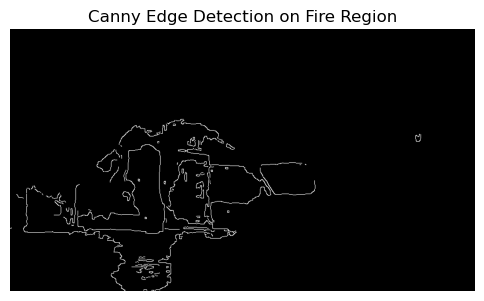

In [56]:
import cv2
img_canny_np = np.array(img_canny) 
edges=apply_canny_on_fire_region(img_canny_np)

In [57]:
def draw_bounding_boxes_on_edges(fire_region_np, edges, min_area=100):
    """
    Draws bounding boxes around edge-detected regions on fire_region_np.
    
    fire_region_np: original fire-only image (NumPy array)
    edges: binary image from Canny (NumPy array)
    min_area: minimum area to draw a box
    """
    fire_with_boxes = fire_region_np.copy()
    
    # Find contours from edge map
    contours, _ = cv2.findContours(edges, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)

    for cnt in contours:
        x, y, w, h = cv2.boundingRect(cnt)
        area = w * h
        if area > min_area:
            cv2.rectangle(fire_with_boxes, (x, y), (x + w, y + h), (0, 255, 0), 2)  # Green box
    
    plt.figure(figsize=(8, 6))
    plt.imshow(fire_with_boxes)
    plt.title("Fire Region with Bounding Boxes (d)")
    plt.axis("off")
    plt.show()

    return fire_with_boxes


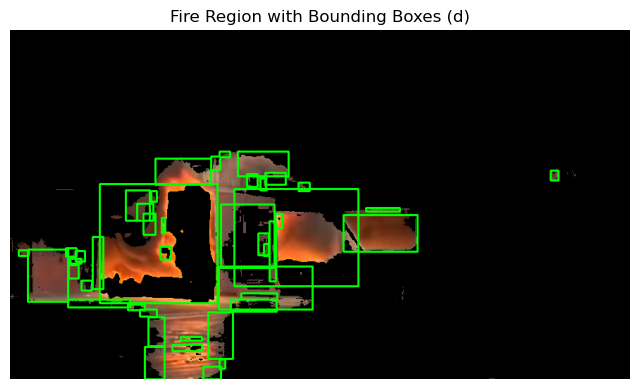

In [58]:
fire_with_boxes=draw_bounding_boxes_on_edges(img_canny_np,edges)

3)Comparison part

In [59]:
current_directory = os.getcwd()
print(current_directory)
im_path_comp = os.path.join(current_directory, "Comparison")
print("Fire Image Directory:", im_path_comp)
im_fire_comp = os.path.join(im_path_comp, "fire.png")
print("Fire Image Directory:", im_fire_comp)
im_firecomp = Image.open(im_fire_comp).convert('RGB')
im_mask_comp = os.path.join(im_path_comp, "mask.png")
print("Fire Image Directory:", im_mask_comp)
im_maskcomp = Image.open(im_mask_comp).convert('RGB')

/home/ladans/Computer Vision/Final Project
Fire Image Directory: /home/ladans/Computer Vision/Final Project/Comparison
Fire Image Directory: /home/ladans/Computer Vision/Final Project/Comparison/fire.png
Fire Image Directory: /home/ladans/Computer Vision/Final Project/Comparison/mask.png


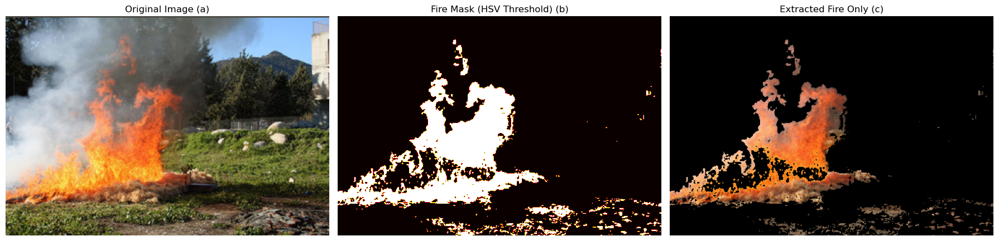

In [60]:
detect_fire_pil(im_firecomp)

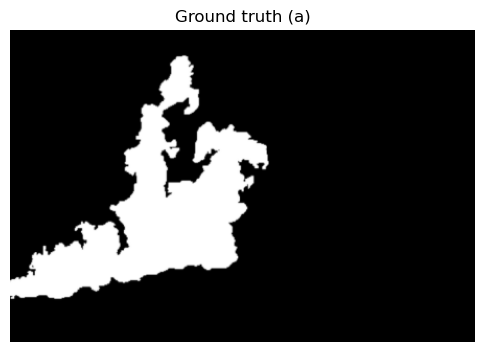

In [69]:
plt.figure(figsize=(6, 6))
plt.imshow(im_maskcomp, cmap='gray')
plt.title("Ground truth (a)")
plt.axis("off")
plt.show()

In [65]:
import numpy as np
from sklearn.metrics import confusion_matrix

predicted = Image.open('fire_mask_output.png').convert('RGB')
ground_truth = im_maskcomp

# Convert PIL images to grayscale just in case
predicted = predicted.convert("L")
ground_truth = ground_truth.convert("L")

# Resize predicted mask to match ground truth size
predicted = predicted.resize(ground_truth.size, Image.NEAREST)

# Convert to NumPy arrays
predicted_np = np.array(predicted)
ground_truth_np = np.array(ground_truth)

# Binarize if needed
predicted_bin = (predicted_np > 0).astype(np.uint8)
ground_truth_bin = (ground_truth_np > 0).astype(np.uint8)

# Flatten arrays
y_pred = predicted_bin.flatten()
y_true = ground_truth_bin.flatten()

# Sanity check
print("Pred shape:", predicted_bin.shape)
print("GT shape:", ground_truth_bin.shape)
print("Match:", y_pred.shape == y_true.shape)

# Compute confusion matrix
tn, fp, fn, tp = confusion_matrix(y_true, y_pred, labels=[0, 1]).ravel()

# Compute metrics
accuracy = (tp + tn) / (tp + fp + fn + tn)
precision = tp / (tp + fp) if (tp + fp) != 0 else 0
recall = tp / (tp + fn) if (tp + fn) != 0 else 0
iou = tp / (tp + fp + fn) if (tp + fp + fn) != 0 else 0
f1 = 2 * precision * recall / (precision + recall) if (precision + recall) != 0 else 0

# Print results
print(f"Accuracy: {accuracy:.4f}")
print(f"Precision: {precision:.4f}")
print(f"Recall: {recall:.4f}")
print(f"IoU: {iou:.4f}")
print(f"F1 Score: {f1:.4f}")


Pred shape: (299, 445)
GT shape: (299, 445)
Match: True
Accuracy: 0.8870
Precision: 0.6974
Recall: 0.6223
IoU: 0.4900
F1 Score: 0.6577


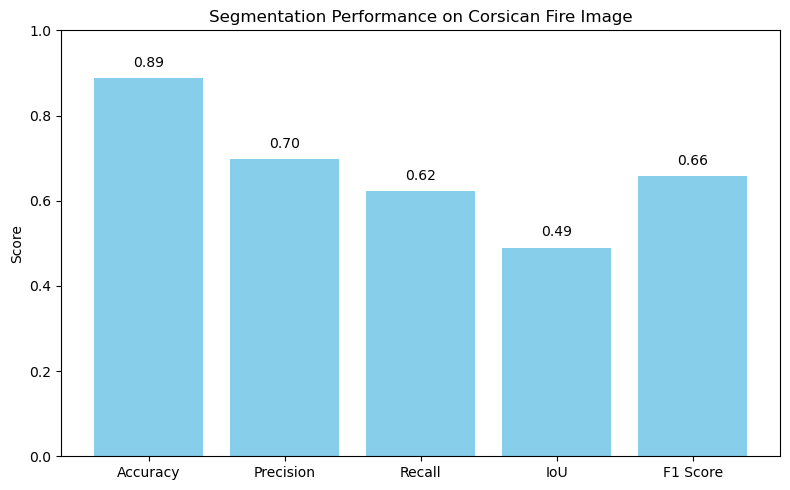

In [67]:
import matplotlib.pyplot as plt

# Your computed metrics
metrics = ['Accuracy', 'Precision', 'Recall', 'IoU', 'F1 Score']
values = [accuracy, precision, recall, iou, f1]

# Plot
plt.figure(figsize=(8, 5))
bars = plt.bar(metrics, values, color='skyblue')
plt.ylim(0, 1)
plt.title('Segmentation Performance on Corsican Fire Image')
plt.ylabel('Score')

# Add values on top of bars
for bar in bars:
    yval = bar.get_height()
    plt.text(bar.get_x() + bar.get_width()/2, yval + 0.02, f"{yval:.2f}", ha='center', va='bottom')

plt.tight_layout()
plt.show()
